Full image dimensions: 16091 x 18457

Band value ranges after scaling:
Green: 0.0000 to 0.1945
Red: 0.0000 to 0.1867
NIR: 0.0000 to 0.3470

Region of Interest: x(4100-13000), y(400-15000)
ROI dimensions: 14600 x 8900


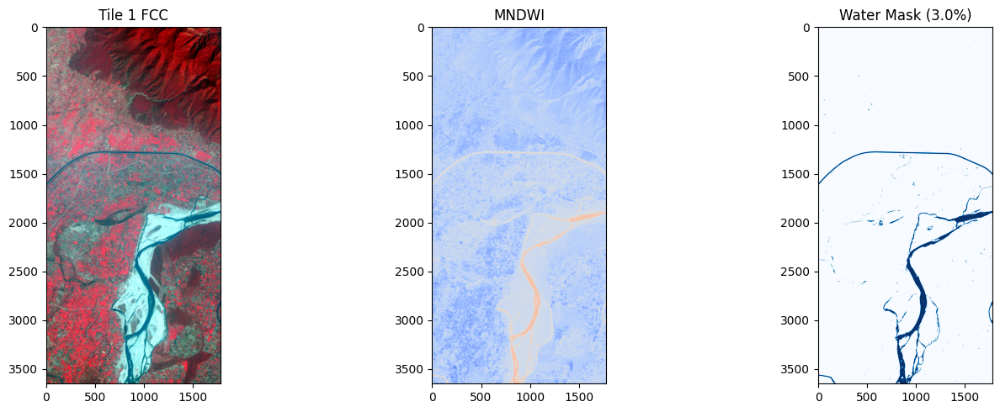

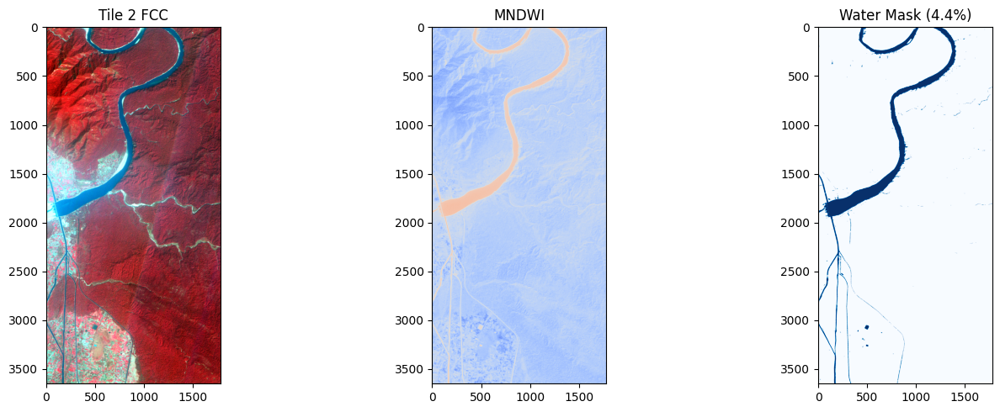

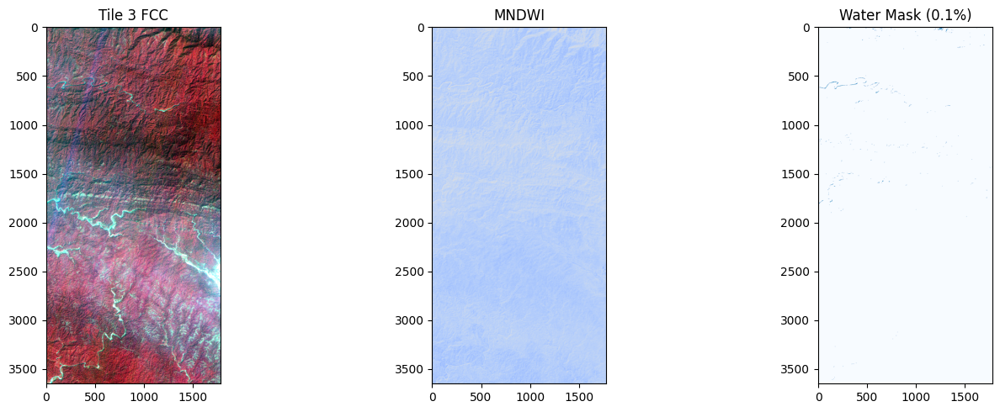

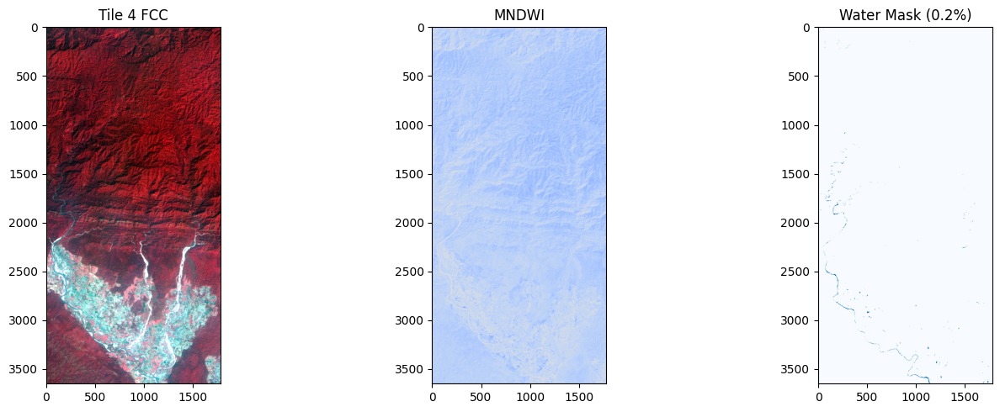

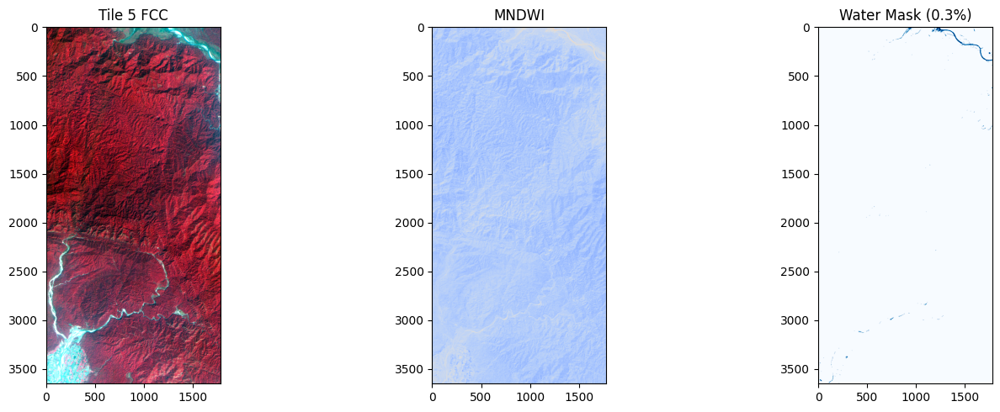

...

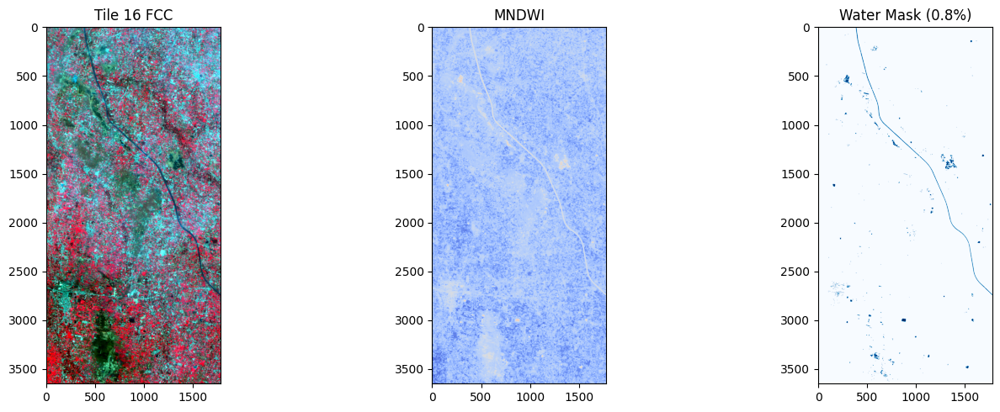

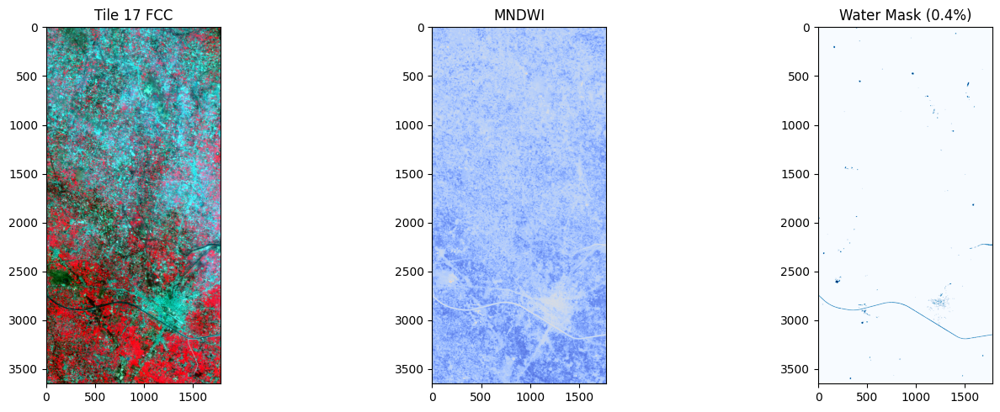

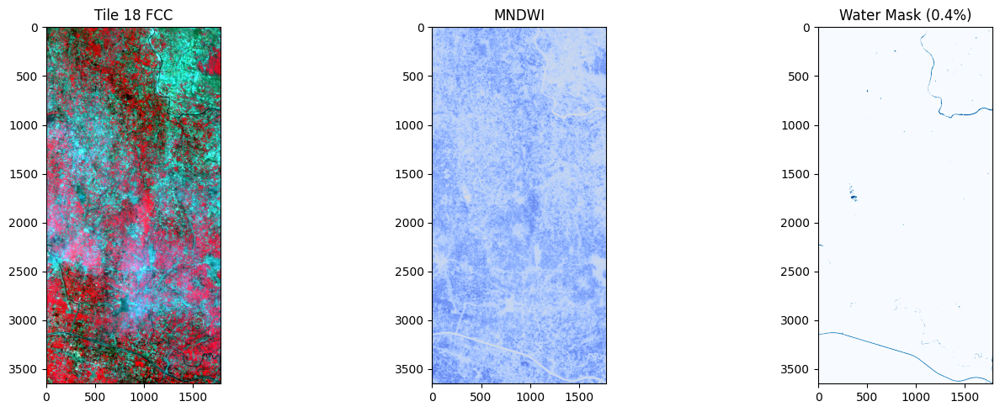

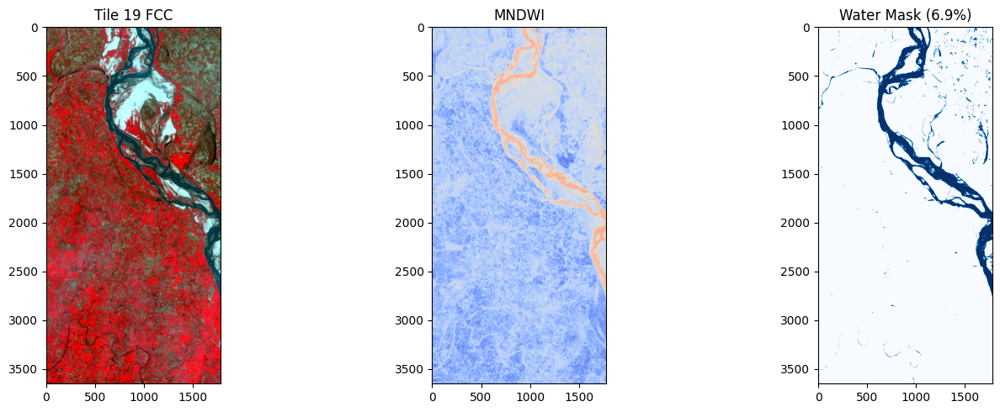

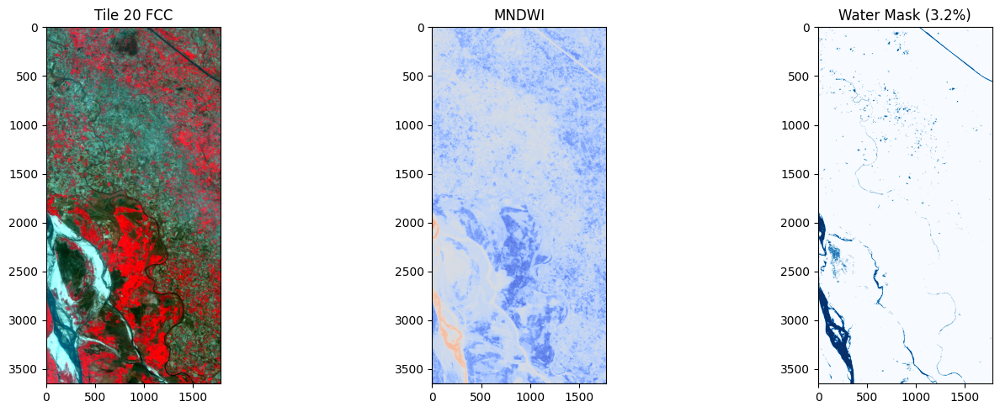


Water Detection Summary:
Average Water Percentage: 2.37%
Maximum Water Percentage: 7.31%
Minimum Water Percentage: 0.13%

Top 5 Water-rich Tiles:
Tile 6: 7.3% water at (4100, 4050, 5880, 7700)
Tile 19: 6.9% water at (9440, 11350, 11220, 15000)
Tile 13: 5.2% water at (7660, 7700, 9440, 11350)
Tile 7: 4.7% water at (5880, 4050, 7660, 7700)
Tile 2: 4.4% water at (5880, 400, 7660, 4050)


In [18]:
import rasterio
import numpy as np
from skimage.morphology import remove_small_objects
import matplotlib.pyplot as plt
import math
from skimage.filters import threshold_otsu

def load_liss4_band(path):
    """Load and properly scale LISS-IV band (10-bit or 12-bit)"""
    with rasterio.open(path) as src:
        band = src.read(1)
        # Check if data is 10-bit (0-1023) or 12-bit (0-4095)
        max_val = 1023 if band.max() <= 1023 else 4095
        return band.astype('float32') / max_val

# Load bands
green = load_liss4_band('BAND2.tif')  # Green (0.52-0.59µm)
red = load_liss4_band('BAND3.tif')    # Red (0.62-0.68µm)
nir = load_liss4_band('BAND4.tif')    # NIR (0.77-0.86µm)

# Validate band ranges
full_height, full_width = green.shape
print(f"Full image dimensions: {full_height} x {full_width}")
print("\nBand value ranges after scaling:")
print(f"Green: {green.min():.4f} to {green.max():.4f}")
print(f"Red: {red.min():.4f} to {red.max():.4f}")
print(f"NIR: {nir.min():.4f} to {nir.max():.4f}")

# Define ROI
x_start, x_end = 4100, 13000
y_start, y_end = 400, 15000

# Validate coordinates
x_start = max(0, min(x_start, full_width))
x_end = max(x_start, min(x_end, full_width))
y_start = max(0, min(y_start, full_height))
y_end = max(y_start, min(y_end, full_height))

print(f"\nRegion of Interest: x({x_start}-{x_end}), y({y_start}-{y_end})")

# Extract ROI
green_roi = green[y_start:y_end, x_start:x_end]
red_roi = red[y_start:y_end, x_start:x_end]
nir_roi = nir[y_start:y_end, x_start:x_end]

roi_height, roi_width = green_roi.shape
print(f"ROI dimensions: {roi_height} x {roi_width}")

def enhanced_water_detection(green_tile, nir_tile, red_tile=None, min_size=10):
    """
    Optimized water detection for LISS-IV with:
    - Modified NDWI (Green-NIR)
    - Dynamic thresholding
    - Brightness filtering
    - Optional NDVI vegetation exclusion
    """
    # Calculate Modified NDWI
    mndwi = (green_tile - nir_tile) / (green_tile + nir_tile + 1e-10)
    
    # Dynamic threshold using Otsu's method
    try:
        thresh = threshold_otsu(mndwi[(mndwi > -1) & (mndwi < 1)]) * 0.1  # 80% of Otsu
    except:
        thresh = 0.05  # Fallback threshold
    
    # Brightness filter (water is typically dark)
    brightness = (green_tile + nir_tile) / 2
    brightness_thresh = 0.12  # Adjusted for LISS-IV
    
    # Create initial water mask
    water_mask = (mndwi > thresh) & (brightness < brightness_thresh)
    
    # Optional vegetation exclusion using NDVI
    if red_tile is not None:
        ndvi = (nir_tile - red_tile) / (nir_tile + red_tile + 1e-10)
        water_mask = water_mask & (ndvi < 0.2)  # Exclude vegetation
    
    # Remove small objects
    return remove_small_objects(water_mask, min_size=min_size), mndwi

def scale_for_display(img, percentile=98):
    """Enhanced contrast stretching for visualization"""
    img = np.nan_to_num(img, nan=0.0)
    p2, p98 = np.percentile(img[img > 0], (2, percentile))
    return np.clip((img - p2) / (p98 - p2), 0, 1)

# Process tiles
rows, cols = 4, 5
tile_height = roi_height // rows
tile_width = roi_width // cols

water_percentages = []
tile_info = []

# Main processing loop
for i in range(rows):
    for j in range(cols):
        tile_idx = i * cols + j + 1
        
        # Extract tile
        y1, y2 = i * tile_height, (i + 1) * tile_height
        x1, x2 = j * tile_width, (j + 1) * tile_width
        green_tile = green_roi[y1:y2, x1:x2]
        red_tile = red_roi[y1:y2, x1:x2]
        nir_tile = nir_roi[y1:y2, x1:x2]
        
        # Detect water
        water_mask, mndwi = enhanced_water_detection(green_tile, nir_tile, red_tile)
        water_pct = np.sum(water_mask) / water_mask.size * 100
        
        # Store results
        water_percentages.append(water_pct)
        tile_info.append({
            'tile': tile_idx,
            'water_pct': water_pct,
            'coords': (x_start + x1, y_start + y1, x_start + x2, y_start + y2)
        })
        
        # Visualization
        fcc = np.dstack((scale_for_display(nir_tile), 
                        scale_for_display(red_tile), 
                        scale_for_display(green_tile)))
        
        plt.figure(figsize=(15, 5))
        plt.subplot(131); plt.imshow(fcc); plt.title(f'Tile {tile_idx} FCC')
        plt.subplot(132); plt.imshow(mndwi, cmap='coolwarm', vmin=-0.5, vmax=0.5); plt.title('MNDWI')
        plt.subplot(133); plt.imshow(water_mask, cmap='Blues'); plt.title(f'Water Mask ({water_pct:.1f}%)')
        plt.tight_layout()
        plt.show()

# Summary statistics
print("\nWater Detection Summary:")
print(f"Average Water Percentage: {np.mean(water_percentages):.2f}%")
print(f"Maximum Water Percentage: {np.max(water_percentages):.2f}%")
print(f"Minimum Water Percentage: {np.min(water_percentages):.2f}%")

# Sort tiles by water percentage
sorted_tiles = sorted(tile_info, key=lambda x: x['water_pct'], reverse=True)
print("\nTop 5 Water-rich Tiles:")
for tile in sorted_tiles[:5]:
    print(f"Tile {tile['tile']}: {tile['water_pct']:.1f}% water at {tile['coords']}")